# Julia 機器學習：Clustering 分群模型

## 作業 028：資料分群

從提供的檔案中讀取資料，利用分群模型將資料分群後並將資料視覺化。資料中有 15 群，並利用 k-means 去對資料做分群。資料取自 http://cs.uef.fi/sipu/datasets/

In [1]:
using Clustering, CSV, DataFrames, Gadfly

## 讀取資料

In [2]:
data = CSV.read("Day_028_s1-set.csv")

,x,y
,Int64,Int64
1,664159,550946
2,665845,557965
3,597173,575538
4,618600,551446
5,635690,608046
6,588100,557588
7,582015,546191
8,604678,574577
9,572029,518313


In [3]:
X = Matrix(data[:, 1:2])'

2×5000 LinearAlgebra.Adjoint{Int64,Array{Int64,2}}:
 664159  665845  597173  618600  635690  …  691827  650661  599647  684091
 550946  557965  575538  551446  608046     863963  861267  858702  842566

## K-means 分群模型

In [4]:
k = 15
result = kmeans(X, k)
dump(result)

KmeansResult{Array{Float64,2},Float64,Int64}
  centers: Array{Float64}((2, 15)) [858496.2478632479 399632.2266288952 … 477147.3333333333 139395.22898550724; 546100.264957265 404675.3767705382 … 149363.1056910569 558143.9420289855]
  assignments: Array{Int64}((5000,)) [4, 4, 4, 4, 4, 4, 4, 4, 4, 4  …  8, 8, 8, 8, 8, 8, 8, 8, 8, 8]
  costs: Array{Float64}((5000,)) [7.279799735436279e9, 8.453703511872803e9, 8.659941987931396e9, 4.646592353048584e9, 1.6053924104709717e10, 6.029147430032471e9, 4.797869316061768e9, 8.321899492234131e9, 2.780060633918213e9, 8.323616584843506e9  …  2.782454939169922e8, 5.595652414916992e9, 2.9773947540195312e9, 1.2777467247363281e8, 4.674976160428711e9, 1.0817732159863281e8, 4.381570026557617e8, 4.130407882919922e8, 5.097647169803223e9, 5.81265660621582e8]
  counts: Array{Int64}((15,)) [351, 353, 240, 614, 321, 329, 341, 352, 327, 334, 331, 315, 324, 123, 345]
  wcounts: Array{Int64}((15,)) [351, 353, 240, 614, 321, 329, 341, 352, 327, 334, 331, 315, 324, 123,

## 取得分群

In [5]:
data[!, :cluster] = string.(assignments(result));

## 取得群中心

In [6]:
result.centers

2×15 Array{Float64,2}:
 858496.0  399632.0  520664.0  611739.0  …  797969.0  477147.0  139395.0
 546100.0  404675.0  189153.0  483626.0     321884.0  149363.0  558144.0

## 視覺化分群結果

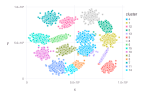

In [7]:
plot(data, x="x", y="y", color="cluster", Geom.point)

In [8]:
ci=range(colorant"blue", stop=colorant"green", length=k)

In [9]:
centers=convert(DataFrame, result.centers')

,x1,x2
,Float64,Float64
1,858496.0,546100.0
2,399632.0,404675.0
3,520664.0,189153.0
4,611739.0,483626.0
5,822689.0,730559.0
6,337265.0,562123.0
7,244655.0,847642.0
8,670929.0,862766.0
9,852058.0,157686.0


In [10]:
rename!(centers, [:x, :y])

,x,y
,Float64,Float64
1,858496.0,546100.0
2,399632.0,404675.0
3,520664.0,189153.0
4,611739.0,483626.0
5,822689.0,730559.0
6,337265.0,562123.0
7,244655.0,847642.0
8,670929.0,862766.0
9,852058.0,157686.0


In [11]:
describe(centers)

,variable,mean,min,median,max,nunique,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Nothing,Nothing,DataType
1,x,509129.0,139395.0,477147.0,858496.0,,,Float64
2,y,474035.0,149363.0,483626.0,862766.0,,,Float64


In [12]:
centers[!, :cluster] = string.(range(1, length=nrow(centers)))

15-element Array{String,1}:
 "1"
 "2"
 "3"
 "4"
 "5"
 "6"
 "7"
 "8"
 "9"
 "10"
 "11"
 "12"
 "13"
 "14"
 "15"

In [13]:
show(centers, allrows=true, allcols=true)

15×3 DataFrame
│ Row │ x        │ y        │ cluster │
│     │ Float64  │ Float64  │ String  │
├─────┼──────────┼──────────┼─────────┤
│ 1   │ 858496.0 │ 546100.0 │ 1       │
│ 2   │ 399632.0 │ 404675.0 │ 2       │
│ 3   │ 520664.0 │ 189153.0 │ 3       │
│ 4   │ 611739.0 │ 483626.0 │ 4       │
│ 5   │ 822689.0 │ 730559.0 │ 5       │
│ 6   │ 337265.0 │ 562123.0 │ 6       │
│ 7   │ 244655.0 │ 847642.0 │ 7       │
│ 8   │ 670929.0 │ 862766.0 │ 8       │
│ 9   │ 852058.0 │ 157686.0 │ 9       │
│ 10  │ 167856.0 │ 347813.0 │ 10      │
│ 11  │ 318258.0 │ 162407.0 │ 11      │
│ 12  │ 418183.0 │ 786582.0 │ 12      │
│ 13  │ 797969.0 │ 321884.0 │ 13      │
│ 14  │ 477147.0 │ 149363.0 │ 14      │
│ 15  │ 139395.0 │ 558144.0 │ 15      │

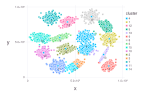

In [14]:
p = plot( 
    Theme(major_label_font_size=16pt),
    layer(centers, x="x", y="y", Geom.point, label="cluster", Geom.label),
    layer(data, x="x", y="y", color="cluster", Geom.point)
    )

In [15]:
i = SVG("Day_028_output.svg")
draw(i, p)

false

![Day_028_output.svg](Day_028_output.svg)